In [3]:
# load necessary package

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


In [4]:

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler


In [5]:

import keras
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
import matplotlib.pyplot as plt

In [5]:
# load the data
# training data
saleste_data = pd.read_csv('/Users/qinxi/Documents/5470/m5-forecasting-accuracy/sales_train_evaluation.csv') # main information during d_1 - d_1941
salestv_data = pd.read_csv('//Users/qinxi/Documents/5470/m5-forecasting-accuracy/sales_train_validation.csv') # main information during d_1 - d_1913, ground truth of validation is provided in train_sales
cal_data = pd.read_csv('/Users/qinxi/Documents/5470/m5-forecasting-accuracy/calendar.csv')                   # calendar data
sellp_data = pd.read_csv('/Users/qinxi/Documents/5470/m5-forecasting-accuracy/sell_prices.csv')              # the price of products
# submission file
ss_data = pd.read_csv('/Users/qinxi/Documents/5470/m5-forecasting-accuracy/sample_submission.csv')

sales_train_evaluation.csv

Size: (30490, 1947)
Data Style: This file contains 30490 rows of data, where each row represents sales data for a specific product in a particular store and state. It has 1947 columns, including:
id: Unique identifier for the sales data.
item_id: Unique identifier for the product.
dept_id: Identifier for the department to which the product belongs.
cat_id: Identifier for the category to which the product belongs.
store_id: Unique identifier for the store.
state_id: Identifier for the state.
d_1 to d_1941: Sales data for each day from day 1 to day 1941.

sales_train_validation.csv

Size: (30490, 1919)
Data Style: Similar to sales_train_evaluation.csv, this file also contains 30490 rows of data with 1919 columns, including:
id: Unique identifier for the sales data.
item_id: Unique identifier for the product.
dept_id: Identifier for the department to which the product belongs.
cat_id: Identifier for the category to which the product belongs.
store_id: Unique identifier for the store.
state_id: Identifier for the state.
d_1 to d_1913: Sales data for each day from day 1 to day 1913.

sell_prices.csv

Size: (6841121, 4)
Data Style: This file contains 6841121 rows of data, where each row represents the selling price of a different product (item_id) in a specific store (store_id) on a particular week (wm_yr_wk). It has 4 columns, including:
store_id: Unique identifier for the store.
item_id: Unique identifier for the product.
wm_yr_wk: Week-related identifier specifying the date of the price.
sell_price: The selling price of the product on the specified date.

calendar.csv

Size: (1969, 14)
Data Style: This file contains 1969 rows of data, where each row represents information about a specific date. It has 14 columns, including:
date: The date.
wm_yr_wk: Week-related identifier.
weekday: The day of the week.
wday: The day of the week as a numeric representation (1 for Sunday, 2 for Monday, etc.).
month: The month.
year: The year.
d: A identifier related to the date.
event_name_1, event_type_1: The name and type of the first event happening on that date.
event_name_2, event_type_2: The name and type of the second event happening on that date.
snap_CA, snap_TX, snap_WI: Indicates whether SNAP policy (allowing purchase of SNAP-eligible items) is applicable in California, Texas, and Wisconsin.

sample_submission.csv

Size: (1450000, 8)
Data Style: This file contains 1450000 rows of data, where each row represents the forecasted sales for a specific product in a specific store for the next 28 days. It has 8 columns, including:
id: Unique identifier for the sales data in the submission format (e.g., item_id_store_id_validation).
F1 to F28: Forecasted sales for each of the next 28 days.


In [9]:
salestv_data

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


In [10]:
saleste_data

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,1,0,3,0,1,1,0,0,1,1
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,0,0,1,2,0,1,0,1,0,2
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,1,1,1,4,6,0,1,1,1,0


In [11]:
cal_data

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0


In [12]:
sellp_data

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26
...,...,...,...,...
6841116,WI_3,FOODS_3_827,11617,1.00
6841117,WI_3,FOODS_3_827,11618,1.00
6841118,WI_3,FOODS_3_827,11619,1.00
6841119,WI_3,FOODS_3_827,11620,1.00


In [2]:
pip install kaleido "nbformat>4.2.0"

Note: you may need to restart the kernel to use updated packages.


In [6]:
df_by_cat = saleste_data.groupby(['cat_id'])['id'].count().reset_index(name='count_by_cat')
fig = px.pie(df_by_cat, values='count_by_cat', names='cat_id',
            color_discrete_sequence=px.colors.sequential.YlOrRd,
            width = 500, height=500, title = 'Proportion of product categories')
fig.show()

In [86]:
df_by_cat = saleste_data.groupby(['dept_id'])['id'].count().reset_index(name='count_by_dept')
fig = px.pie(df_by_cat, values='count_by_dept', names='dept_id',
            color_discrete_sequence=px.colors.sequential.YlOrRd,
            width = 500, height=500, title = 'Proportion of product department')
fig.show()
fig.write_image("proportion_of_product_depart.png",width=500,
    height=500,
    scale=10)

In [20]:
df_by_state = saleste_data.groupby(['state_id'])['id'].count().reset_index(name='count_by_state')
fig = px.pie(df_by_state, values='count_by_state', names='state_id',
            color_discrete_sequence=px.colors.sequential.Oryel,
            width = 500, height=500, title = 'Proportion of product sales area')
fig.show()

In [85]:
#store_id
df_by_cat = saleste_data.groupby(['store_id'])['id'].count().reset_index(name='count_by_store')
fig = px.pie(df_by_cat, values='count_by_store', names='store_id',
            color_discrete_sequence=px.colors.sequential.YlOrRd,
            width = 500, height=500, title = 'Proportion of product store')
fig.show()
fig.write_image("proportion_of_product_store.png",width=500,
    height=500,
    scale=10)

In [14]:
print(df_by_cat.to_string(index=False, header=False))

CA_1 3049
CA_2 3049
CA_3 3049
CA_4 3049
TX_1 3049
TX_2 3049
TX_3 3049
WI_1 3049
WI_2 3049
WI_3 3049


In [15]:
sales_data = salestv_data
# Make a list of date columns date_col = [d1,d2,d3,d4...]
date_col = [col for col in sales_data if col.startswith('d_')]

In [16]:
#Calcuating total sales for each row/ id by adding the sales of each of the 1913 days
sales_data['total_sales'] = sales_data[date_col].sum(axis=1)
#Adding all the sales for each state
sales_data.groupby('state_id').agg({"total_sales":"sum"}).reset_index()

,state_id,total_sales
0,CA,28675547
1,TX,18899006
2,WI,18120856


In [18]:
sales_grouped = sales_data.groupby(['cat_id', 'state_id'])['total_sales'].sum().reset_index()

# 计算每个 cat_id 在每个 state_id 中的销售占比
sales_pcts = sales_grouped.pivot(index='cat_id', columns='state_id', values='total_sales')
sales_pcts = sales_pcts.div(sales_pcts.sum(axis=1), axis=0) * 100

# 输出结果
print(sales_pcts)

state_id          CA         TX         WI
cat_id                                    
FOODS      42.573360  28.734616  28.692024
HOBBIES    49.632364  25.998220  24.369416
HOUSEHOLD  44.468674  30.041745  25.489580


In [21]:
print(df_by_state.to_string(index=False, header=False))

CA 12196
TX  9147
WI  9147


In [22]:
sales_pcts.columns = [f'{i}_{j}' if j != '' else f'{i}' for i,j in sales_pcts.columns]

In [24]:
fig = px.bar(sales_pcts,
            color_discrete_sequence=px.colors.sequential.Burgyl,
            width = 500, height=500, title = 'Sales Distrubution for each category across states')
fig.show()
fig.write_image("each category across states.png",width=500,
    height=500,
    scale=10)

In [25]:
# extract data
ids = sorted(list(set(saleste_data['id'])))
d_cols = [c for c in saleste_data.columns if 'd_' in c]
sales_pure = saleste_data.set_index('id')[d_cols].T.merge(cal_data.set_index('d')['date'],
            left_index=True,
            right_index=True,
            validate='1:1').set_index('date')


In [26]:
cat_list = ['FOOD', 'HOUSEHOLD', 'HOBBIES']
fig = go.Figure()
# draw figures for every store
for s in cat_list:
    cat_items = [c for c in sales_pure.columns if s in c]
    data = sales_pure[cat_items].sum(axis=1).rolling(90).mean()
    fig.add_trace(go.Scatter(x=np.arange(len(data)), y=data, name=s))

fig.update_layout(yaxis_title="Average Sales Per Day", xaxis_title="Day", title="Average Sales across Time Per Store_id")
fig.update_layout(height=600, width=800)


# Display the plot (optional)
fig.show()
fig.write_image("Average Sales across Time Per Store_id.png",width=500,
    height=500,
    scale=10)


In [27]:
d_cols1 = [c for c in salestv_data.columns if 'd_' in c]

In [35]:
past_sales = salestv_data.set_index('id')[d_cols1] \
    .T \
    .merge(cal_data.set_index('d')['date'],
           left_index=True,
           right_index=True,
            validate='1:1') \
    .set_index('date')

store_list = sellp_data['store_id'].unique()
means = []
fig = go.Figure()
for s in store_list:
    store_items = [c for c in past_sales.columns if s in c]
    data = past_sales[store_items].sum(axis=1).rolling(90).mean()
    means.append(np.mean(past_sales[store_items].sum(axis=1)))
    fig.add_trace(go.Scatter(x=np.arange(len(data)), y=data, name=s))

fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Time (per store)")
fig.update_layout(height=600, width=800)
fig.show()
fig.write_image("Rolling Average sales.png",width=800,
    height=600,
    scale=10)

In [36]:
fig = go.Figure()

for i, s in enumerate(store_list):
        store_items = [c for c in past_sales.columns if s in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        fig.add_trace(go.Box(x=[s]*len(data), y=data, name=s))

fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Store name ")
fig.update_layout(height=600, width=800)
fig.show()
fig.write_image("Rolling Average sales vs store name.png",width=800,
    height=600,
    scale=10)

In [32]:
df = pd.DataFrame(np.transpose([means, store_list]))
df.columns = ["Mean sales", "Store name"]
px.bar(df, y="Mean sales", x="Store name", color="Store name", title="Mean sales vs. Store name", width=800)
fig.show()
fig.write_image("Average Sales across Time Per Store_id.png",width=800,
    scale=10)



In [37]:
ids = sorted(list(set(salestv_data['id'])))
d_cols = [c for c in salestv_data.columns if 'd_' in c]
x_1 = salestv_data.loc[salestv_data['id'] == ids[2]].set_index('id')[d_cols].values[0]
x_2 = salestv_data.loc[salestv_data['id'] == ids[1]].set_index('id')[d_cols].values[0]
x_3 = salestv_data.loc[salestv_data['id'] == ids[17]].set_index('id')[d_cols].values[0]

fig = make_subplots(rows=3, cols=1)

fig.add_trace(go.Scatter(x=np.arange(len(x_1)), y=x_1, showlegend=False,
                    mode='lines', name="First sample",
                         marker=dict(color="orange")),
             row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(len(x_2)), y=x_2, showlegend=False,
                    mode='lines', name="Second sample",
                         marker=dict(color="green")),
             row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(len(x_3)), y=x_3, showlegend=False,
                    mode='lines', name="Third sample",
                         marker=dict(color="dodgerblue")),
             row=3, col=1)

fig.update_layout(height=1200, width=800, title_text="Sample sales")
fig.show()
fig.write_image("SAmple sales.png",width=800,
    height=600,
    scale=10)


In [39]:
daysBeforeEvent = pd.DataFrame(np.zeros((1969,8)))
for x, y in cal_data.iterrows():
    if x!=0 and (pd.isnull(cal_data['event_name_1'][x]) == False):
        daysBeforeEvent[0][x-1]=1
    if x!=0 and (pd.isnull(cal_data['event_name_2'][x]) == False):
        daysBeforeEvent[1][x-1]=1
    if x!=0:
        daysBeforeEvent[2][x-1]=cal_data['wday'][x]
    if x!=0:
        daysBeforeEvent[3][x-1]=cal_data['month'][x]
    if x!=0:
        daysBeforeEvent[4][x-1]=cal_data['year'][x]
    if x!=0:
        daysBeforeEvent[5][x-1]=cal_data['snap_CA'][x]
    if x!=0:
        daysBeforeEvent[6][x-1]=cal_data['snap_TX'][x]
    if x!=0:
        daysBeforeEvent[7][x-1]=cal_data['snap_WI'][x]

/var/folders/zd/m4vm41j95rg2m1rbs5dcsm7h0000gn/T/ipykernel_21630/3585420546.py:8: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/var/folders/zd/m4vm41j95rg2m1rbs5dcsm7h0000gn/T/ipykernel_21630/3585420546.py:10: FutureWarning:

ChainedAssignm

In [43]:
dataPath = "/Users/qinxi/Documents/5470/m5-forecasting-accuracy/"
timesteps = 14
startDay = 350
dt = pd.read_csv(dataPath + "/sales_train_evaluation.csv")
saleste_data = pd.read_csv(dataPath +'/sales_train_evaluation.csv') # main information during d_1 - d_1941
salestv_data = pd.read_csv(dataPath +'/sales_train_validation.csv') # main information during d_1 - d_1913, ground truth of validation is provided in train_sales
cal_data = pd.read_csv(dataPath +'/calendar.csv')                   # calendar data
sellp_data = pd.read_csv(dataPath +'/sell_prices.csv')              # the price of products


In [45]:
# submission file
ss_data = pd.read_csv(dataPath +'/sample_submission.csv')
salestv_data_save = salestv_data
float_data = [column for column in salestv_data_save if salestv_data_save[column].dtype == 'float64']
int_data = [column for column in salestv_data_save if salestv_data_save[column].dtype in ['int32', 'int64']]
salestv_data_save[float_data] = salestv_data_save[float_data].astype(np.float32)
salestv_data_save[int_data] = salestv_data_save[int_data].astype(np.int16)
salestv_data_save.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1919 entries, id to d_1913
dtypes: int16(1913), object(6)
memory usage: 112.6+ MB


In [46]:
salestv_data_save = salestv_data_save.T
salestv_data_save.shape
salestv_data_save.head(10)

,0,1,2,3,4,5,6,7,8,9,...,30480,30481,30482,30483,30484,30485,30486,30487,30488,30489
id,HOBBIES_1_001_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_006_CA_1_validation,HOBBIES_1_007_CA_1_validation,HOBBIES_1_008_CA_1_validation,HOBBIES_1_009_CA_1_validation,HOBBIES_1_010_CA_1_validation,...,FOODS_3_818_WI_3_validation,FOODS_3_819_WI_3_validation,FOODS_3_820_WI_3_validation,FOODS_3_821_WI_3_validation,FOODS_3_822_WI_3_validation,FOODS_3_823_WI_3_validation,FOODS_3_824_WI_3_validation,FOODS_3_825_WI_3_validation,FOODS_3_826_WI_3_validation,FOODS_3_827_WI_3_validation
item_id,HOBBIES_1_001,HOBBIES_1_002,HOBBIES_1_003,HOBBIES_1_004,HOBBIES_1_005,HOBBIES_1_006,HOBBIES_1_007,HOBBIES_1_008,HOBBIES_1_009,HOBBIES_1_010,...,FOODS_3_818,FOODS_3_819,FOODS_3_820,FOODS_3_821,FOODS_3_822,FOODS_3_823,FOODS_3_824,FOODS_3_825,FOODS_3_826,FOODS_3_827
dept_id,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,HOBBIES_1,...,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3,FOODS_3
cat_id,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,HOBBIES,...,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS,FOODS
store_id,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,CA_1,...,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3,WI_3
state_id,CA,CA,CA,CA,CA,CA,CA,CA,CA,CA,...,WI,WI,WI,WI,WI,WI,WI,WI,WI,WI
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
d_3,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
d_4,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0


In [47]:
salestv_data_save = salestv_data_save[6:]

In [61]:
daysBeforeEvent = pd.DataFrame(np.zeros((1969,8)))

In [62]:
for x, y in cal_data.iterrows():
    if x!=0 and (pd.isnull(cal_data['event_name_1'][x]) == False):
        daysBeforeEvent[0][x-1]=1
    if x!=0 and (pd.isnull(cal_data['event_name_2'][x]) == False):
        daysBeforeEvent[1][x-1]=1
    if x!=0:
        daysBeforeEvent[2][x-1]=cal_data['wday'][x]
    if x!=0:
        daysBeforeEvent[3][x-1]=cal_data['month'][x]
    if x!=0:
        daysBeforeEvent[4][x-1]=cal_data['year'][x]
    if x!=0:
        daysBeforeEvent[5][x-1]=cal_data['snap_CA'][x]
    if x!=0:
        daysBeforeEvent[6][x-1]=cal_data['snap_TX'][x]
    if x!=0:
        daysBeforeEvent[7][x-1]=cal_data['snap_WI'][x]

/var/folders/zd/m4vm41j95rg2m1rbs5dcsm7h0000gn/T/ipykernel_21630/2210015409.py:7: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/var/folders/zd/m4vm41j95rg2m1rbs5dcsm7h0000gn/T/ipykernel_21630/2210015409.py:9: FutureWarning:

ChainedAssignme

In [67]:
daysBeforeTest = daysBeforeEvent[1913:1941]
daysBeforeTrain = daysBeforeEvent[0:1913]
daysBeforeTrain.columns = ['oneDayBeforeEvent1','oneDayBeforeEvent2','oneDayBeforewday','oneDayBeforemonth','oneDayBeforeyear','oneDayBeforesnap_CA','oneDayBeforesnap_TX','oneDayBeforesnap_WI']
daysBeforeTrain.index = salestv_data_save.index
final_data = pd.concat([salestv_data_save, daysBeforeTrain], axis=1)
sc = MinMaxScaler(feature_range=(0,1))
final_data.columns = final_data.columns.astype(str)
final_data_scaled = sc.fit_transform(final_data)
print(final_data_scaled)


[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 1.         1.         0.        ]
 ...
 [0.         0.         0.16666667 ... 0.         0.         0.        ]
 [0.2        0.         0.16666667 ... 0.         0.         0.        ]
 [0.2        0.         0.16666667 ... 0.         0.         0.        ]]


In [68]:
final_data_scaled.shape
X_train = []
y_train = []

for i in range(14,1913):
    X_train.append(final_data_scaled[i-14:i])
    y_train.append(final_data_scaled[i][0:30490])

In [77]:
X_train = np.array(X_train)
y_train_1 = np.array(y_train)
# random choose
sample_size = 1000
random_indices = np.random.choice(X_train.shape[0], sample_size, replace=False)  # 随机选择行索引

##X_train_sample = X_train.iloc[random_indices]  # 从 X_train 中选择随机行
##y_train_sample = y_train_1.iloc[random_indices]

In [78]:
# X_train 是 ndarray
X_train_sample = X_train[random_indices]        # 直接用索引数组
y_train_sample = y_train_1[random_indices]      # 若 y_train_1 也是 ndarray
##y_train_sample = y_train_1.iloc[random_indices]

In [79]:
X_train_sample

array([[[0.        , 0.        , 0.        , ..., 0.        ,
         1.        , 1.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         1.        , 1.        ],
        [0.2       , 0.        , 0.        , ..., 0.        ,
         1.        , 0.        ],
        ...,
        [0.2       , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.2       , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ]],

       [[0.        , 0.2       , 0.        , ..., 1.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 1.        ,
         1.        , 1.        ],
        [0.        , 0.        , 0.        , ..., 1.        ,
         1.        , 1.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        ,
         1.        , 1.        ],
        [0. 

In [80]:
y_train_sample

array([[0.  , 0.  , 0.  , ..., 0.05, 0.  , 0.  ],
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       ...,
       [0.  , 0.  , 0.  , ..., 0.15, 0.  , 0.  ],
       [0.  , 0.  , 0.  , ..., 0.05, 0.  , 0.25],
       [0.  , 0.  , 0.  , ..., 0.1 , 0.  , 0.  ]], shape=(1000, 30490))

In [83]:
X_train_sample = pd.DataFrame(X_train_sample)
y_train_sample = pd.Series(y_train_sample)

ValueError: Must pass 2-d input. shape=(1000, 14, 30498)

In [84]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt



#model
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression ()
lr.fit(X_train_sample,y_train_sample)
# lr.predict(X_val)

#coef
# print('训练模型自变量参数为：',lr.coef_)
# print('训练模型截距为：',lr.intercept_)

ValueError: Found array with dim 3, while dim <= 2 is required by LogisticRegression.

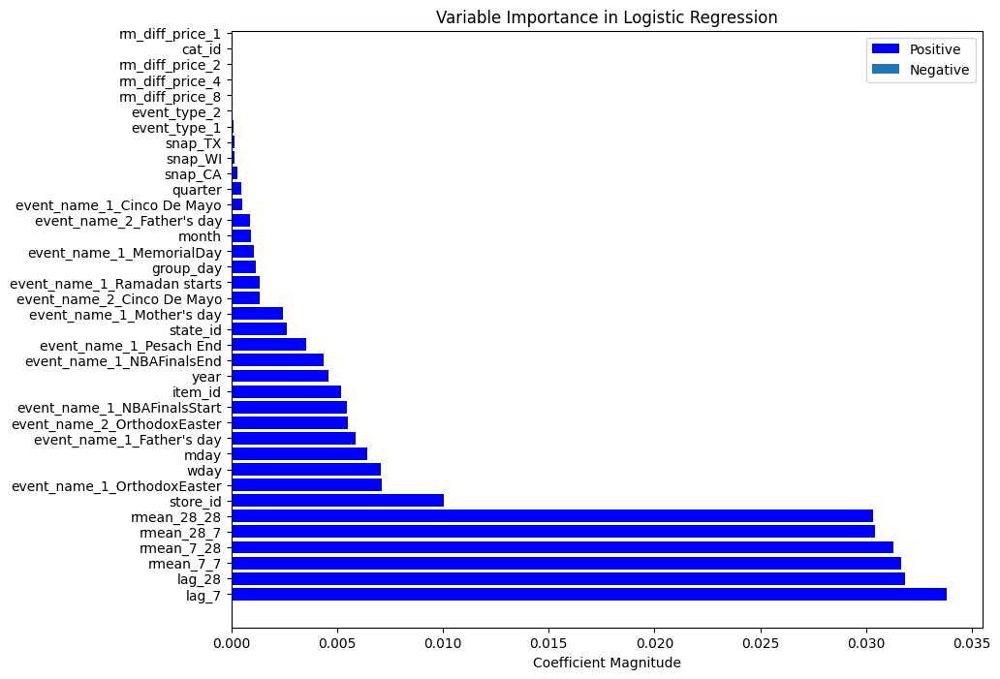

In [ ]:
coef_abs = np.abs(lr.coef_[0])
# 获取变量名称
variable_names = X_train.columns

# 将系数和变量名称组合成 DataFrame，方便排序
coef_df = pd.DataFrame({'Variable': variable_names, 'Coefficient': coef_abs})

# 根据系数的绝对值大小降序排序
coef_df_sorted = coef_df.sort_values(by='Coefficient', ascending=False)

# 分离正系数和负系数
positive_coef = coef_df_sorted[coef_df_sorted['Coefficient'] > 0]
negative_coef = coef_df_sorted[coef_df_sorted['Coefficient'] < 0]

# 绘制变量重要性图
plt.figure(figsize=(10, 8))

# 绘制正系数条形图
plt.barh(range(len(positive_coef)), positive_coef['Coefficient'], color='b', align='center', label='Positive')

# 绘制负系数条形图
plt.barh(range(len(negative_coef)), negative_coef['Coefficient'], color='r', align='center', label='Negative')

# 设置 y 轴刻度和标签
plt.yticks(range(len(coef_df_sorted)), coef_df_sorted['Variable'])
plt.xlabel('Coefficient Magnitude')
plt.title('Variable Importance in Logistic Regression')
plt.legend()

plt.show()